In [34]:
from google.colab import drive
drive.mount('/gdrive')
%cd "/gdrive/My Drive/Causality-Experiments/Paper1/notebooks/new-encoder-experiments"

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive/.shortcut-targets-by-id/1i7sSt69-Q0ifBm21oC5B4EqD8-3EkGV8/Causality-Experiments/Paper1/notebooks/new-encoder-experiments


In [35]:
!python -m pip install -r "../../requirements.txt"

In [36]:
import sys
sys.path.append('../..')

In [37]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import numpy as np
from scipy import interpolate

from pathlib import Path
import random
import tqdm.notebook as tqdm
from copy import deepcopy
from argparse import Namespace
import warnings

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [38]:
%ls

encoder_experiments.ipynb  encoder_separation_experiments.ipynb
encoder.py                 __pycache__/


In [39]:
sys.path.insert(1, str(Path("..") / ".." / "causal_meta" / "utils"))
sys.path.insert(1, str(Path("..") / ".." / "causal_meta" / "modules"))

from causal_meta.utils.data_utils import RandomSplineSCM
import causal_meta.utils.train_utils as tu
from encoder import Rotor
from mdn import MDN, GMM, mdn_nll
from gmm import GaussianMixture

In [40]:
SEED = 91023
torch.manual_seed(SEED)
np.random.seed(SEED)

# Boilerplate

## Utilities

In [41]:
def normal(mean, std, N): 
    return torch.normal(torch.ones(N).mul_(mean), torch.ones(N).mul_(std)).view(-1, 1)

def normal_like(X): 
    mean = X.mean()
    std = X.std()
    return normal(mean, std, X.size(0))

def mlp(opt): 
    if opt.NUM_MID_LAYERS == -1: 
        return nn.Linear(opt.INP_DIM, opt.OUT_DIM)
    else:
        return nets.MLP(opt.INP_DIM, opt.OUT_DIM, opt.NUM_MID_LAYERS, 
                        opt.CAPACITY, opt.INP_NOISE)

## Mixture Density

In [42]:
def mdn(opt): 
    return MDN(opt.CAPACITY, opt.NUM_COMPONENTS)

def gmm(opt): 
    return GaussianMixture(opt.GMM_NUM_COMPONENTS)

## Reversible Encoder

In [43]:
def xcodergen(opt): 
    # Make rotor
    return Rotor(opt.XCODER_INIT)

## Ground Truth Generator

We use a posterior of the form: 

$$
P(Y | X) = \sum_i \pi_i(X) \mathcal{N}(\mu_i(X), \sigma_i(X))
$$

which is a mixture of 10 gaussians. 

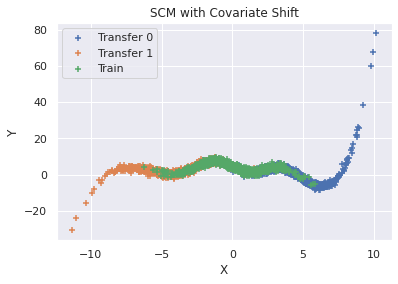

In [44]:
# Test
rand_scm = RandomSplineSCM(False, True, 8, 8, 3, range_scale=1.)

plt.figure()
plt.title("SCM with Covariate Shift")
rand_scm.plot(X=normal(4, 2, 1000), show=False, label='Transfer 0')
rand_scm.plot(X=normal(-4, 2, 1000), show=False, label='Transfer 1')
rand_scm.plot(X=normal(0, 2, 1000), show=False, label='Train')
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.show()

## Visualization

In [45]:
def plot_key(frames, key, show=True, label=None, name=None): 
    its, vals = zip(*[(frame.iter_num, getattr(frame, key)) for frame in frames])
    if show:
        plt.figure()
    plt.plot(its, vals, label=label)
    if show:
        plt.xlabel("Iterations")
        plt.ylabel(name if name is not None else key.title())
        plt.show()

## Training

In [46]:
def gradnan_filter(model): 
    nan_found = False
    for p in model.parameters(): 
        nan_mask = torch.isnan(p.grad.data)
        nan_found = bool(nan_mask.any().item())
        p.grad.data[nan_mask] = 0.
    return nan_found

In [47]:
def marginal_nll(opt, inp, nll): 
    model_g = gmm(opt)
    if opt.CUDA: 
        model_g = model_g.cuda()
    model_g.fit(inp, n_iter=opt.EM_ITERS)
    with torch.no_grad():
        loss_marginal = nll(model_g(inp), inp)
    return loss_marginal

In [48]:
def encoder_train_shared_regret(opt, model_x2y, model_y2x, scm, encoder, decoder, alpha): 
    if opt.CUDA: 
        model_x2y = model_x2y.cuda()
        model_y2x = model_y2x.cuda()
        encoder = encoder.cuda()
        decoder = decoder.cuda()
    encoder_optim = torch.optim.Adam(encoder.parameters(), opt.ENCODER_LR)
    alpha_optim = torch.optim.Adam([alpha], opt.ALPHA_LR)
    frames = []

    for meta_iter in tqdm.trange(opt.NUM_META_ITER): 
        # Preheat the models
        _ = tu.train_nll(opt, model_x2y, scm, opt.TRAIN_DISTRY, 'X2Y', 
                         mdn_nll, decoder, encoder)
        _ = tu.train_nll(opt, model_y2x, scm, opt.TRAIN_DISTRY, 'Y2X', 
                         mdn_nll, decoder, encoder)

        # Sample from SCM
        X = opt.TRANS_DISTRY()
        Y = scm(X)
        if opt.CUDA: 
            X, Y = X.cuda(), Y.cuda()
        # Decode 
        with torch.no_grad():
            X, Y = decoder(X, Y)
        # Encode
        X, Y = encoder(X, Y)
        with torch.no_grad():
            if opt.USE_BASELINE:
                baseline_y = marginal_nll(opt, Y, mdn_nll)
                baseline_x = marginal_nll(opt, X, mdn_nll)
            else:
                baseline_y = 0.
                baseline_x = 0.
        # Save state dicts
        state_x2y = deepcopy(model_x2y.state_dict())
        state_y2x = deepcopy(model_y2x.state_dict())
        # Inner loop 
        optim_x2y = torch.optim.Adam(model_x2y.parameters(), lr=opt.FINETUNE_LR)
        optim_y2x = torch.optim.Adam(model_y2x.parameters(), lr=opt.FINETUNE_LR)
        regrets_x2y = []
        regrets_y2x = []
        is_nan = False
        # Evaluate regret discrepancy 
        for t in range(opt.FINETUNE_NUM_ITER):
            loss_x2y = mdn_nll(model_x2y(X), Y)
            loss_y2x = mdn_nll(model_y2x(Y), X)
            if torch.isnan(loss_x2y).item() or torch.isnan(loss_y2x).item(): 
                is_nan = True
                break
            optim_x2y.zero_grad()
            optim_y2x.zero_grad()
            loss_x2y.backward(retain_graph=True) 
            loss_y2x.backward(retain_graph=True)
            # Filter out NaNs that might have sneaked in
            nan_in_x2y = gradnan_filter(model_x2y)
            nan_in_y2x = gradnan_filter(model_y2x)
            if nan_in_x2y or nan_in_y2x: 
                is_nan = True
                break
            optim_x2y.step()
            optim_y2x.step()
            # Store for encoder
            regrets_x2y.append(loss_x2y + baseline_x)
            regrets_y2x.append(loss_y2x + baseline_y)
        if not is_nan:
            # Evaluate total regret
            regret_x2y = torch.stack(regrets_x2y).mean()
            regret_y2x = torch.stack(regrets_y2x).mean()
            # Evaluate losses
            loss = torch.logsumexp(
                torch.stack([F.logsigmoid(alpha) + regret_x2y,
                             F.logsigmoid(-alpha) + regret_y2x]), 
                0)
            # Optimize
            encoder_optim.zero_grad()
            alpha_optim.zero_grad()
            loss.backward()
            # Make sure no nans
            if torch.isnan(encoder.theta.grad.data).any(): 
                encoder.theta.grad.data.zero_()
            if torch.isnan(alpha.grad.data).any(): 
                alpha.grad.data.zero_()
            encoder_optim.step()
            alpha_optim.step()
            # Load original state dicts
            model_x2y.load_state_dict(state_x2y)
            model_y2x.load_state_dict(state_y2x)
            # Add info
            frames.append(Namespace(iter_num=meta_iter, 
                                    regret_x2y=regret_x2y.item(), 
                                    regret_y2x=regret_y2x.item(),
                                    loss=loss.item(),
                                    alpha=alpha.item(), 
                                    theta=encoder.theta.item()))

        else:
            # Load original state dicts
            model_x2y.load_state_dict(state_x2y)
            model_y2x.load_state_dict(state_y2x)
            # Add dummy info
            if train_mode == 'theta':
                frames.append(Namespace(iter_num=meta_iter, 
                                        regret_x2y=float('nan'), 
                                        regret_y2x=float('nan'),
                                        loss=float('nan'),
                                        alpha=float('nan'), 
                                        theta=float('nan')))
                
    return frames

In [49]:
def plot_theta(frames, gt_theta, save=False): 
    its, vals = zip(*[(frame.iter_num, frame.theta / (np.pi / 2)) for frame in frames])
    gt_theta = -gt_theta.item() / (np.pi / 2)
    plt.figure()
    # plt.plot(its, vals, label=r'$\theta_{\mathcal{E}}$', c='black')
    plt.plot(its, vals, label=r'$\theta_{\mathcal{E}}$')
    plt.plot(its, [gt_theta] * len(its), linestyle='--', label=r'Solution 1 $\left(+\frac{\pi}{4}\right)$')
    plt.plot(its, [gt_theta - 1] * len(its), linestyle='--', label=r'Solution 2 $\left(-\frac{\pi}{4}\right)$')
    plt.xlabel("Iterations")
    plt.ylabel("Encoder Angle [π/2 rad]")
    plt.legend()
    if save:
        plt.savefig('fixed-encoder-evo.pdf', bbox_inches='tight', format='pdf')
    plt.show()

In [50]:
def probe_xcoders(encoder, decoder, init_y=.0):
    # Test encoder and decoder
    with torch.no_grad():
        _X = torch.tensor([[1.]])
        _Y = torch.tensor([[init_y]])
        if opt.CUDA:
            encoder.to('cuda')
            decoder.to('cuda')
            _X, _Y = _X.to('cuda'), _Y.to('cuda')
        _X_d, _Y_d = decoder(_X, _Y)
        _X_de, _Y_de = encoder(_X_d, _Y_d)
    print(f"Initial (A, B) = {_X.item()}, {_Y.item()}")
    print(f"Decoded (X, Y) = {_X_d.item()}, {_Y_d.item()}")
    print(f"Encoded (U, V) = {_X_de.item()}, {_Y_de.item()}")

# Experiments with Unfixed Encoders

In [51]:
opt = Namespace()

# Model
opt.CAPACITY = 32
opt.NUM_COMPONENTS = 10
opt.GMM_NUM_COMPONENTS = 10

# Training
opt.LR = 0.01
opt.NUM_ITER = 20
opt.NUM_META_ITER = 1000
opt.ENCODER_LR = 0.01
opt.ALPHA_LR = 0.001
opt.CUDA = True
opt.REC_FREQ = 10
opt.ALPHA_INIT = 0.
opt.USE_BASELINE = True

# Fine tuning
opt.FINETUNE_NUM_ITER = 5
opt.FINETUNE_LR = 0.001
opt.EM_ITERS = 500

# Sampling 
opt.NUM_SAMPLES = 1000
opt.TRAIN_DISTRY = lambda: normal(0, 2, opt.NUM_SAMPLES)
opt.TRANS_DISTRY = lambda: normal(np.random.uniform(-4, 4), 
                                  2, opt.NUM_SAMPLES)

# Encoder
opt.DECODER_DEFAULT = -float(0.5 * np.pi/2)

## Make Xcoders

Make a ground-truth decoder with $\theta_0$. 

In [ ]:
gt_decoder = Rotor(opt.DECODER_DEFAULT)

The real encoder should have $\theta = -\theta_0$. 

In [ ]:
encoder = Rotor(0. * np.pi/2)

In [ ]:
probe_xcoders(encoder, gt_decoder)

## Make Alpha and Models

In [ ]:
alpha = tu.make_alpha(opt)

In [ ]:
model_x2y = mdn(opt)
model_y2x = mdn(opt)

## Train Encoder

If it doesn't work with the seed of your choice, try tuning the (hyper)parameters of ```opt.TRANS_DISTRY```. Since the SCM is generated randomly, it's not possible to know the correct hyper-parameters in advance (unless the seed is fixed). $\sigma \in (1, 2)$ should work fine, but if the range from which the means are sampled is too large, you can have numerical instabilities. If it's too small, the gradient signal to the encoder can be weak. 

In [ ]:
with torch.autograd.detect_anomaly():
    frames = encoder_train_shared_regret(opt, model_x2y, model_y2x, rand_scm, encoder, gt_decoder, alpha)

In [ ]:
plot_theta(frames, gt_decoder.theta)

In [ ]:
plot_key(frames, 'alpha', name='Structural Parameter')

## Parametrized nonlinear encoder rotation and nonlinear transformation with only $\theta$

In [ ]:
class ParametrizedNonLinearTransform(nn.Module):
    def __init__(self, init_theta=0, decoder=False):
        super(ParametrizedNonLinearTransform, self).__init__()
        self.theta = torch.nn.Parameter(torch.tensor(init_theta).float())
        self.decoder = decoder

    def make_rotmat(self):
        mat = self.theta.new(2, 2)
        mat[0, 0] = self.theta.cos()
        mat[0, 1] = -self.theta.sin()
        mat[1, 0] = self.theta.sin()
        mat[1, 1] = self.theta.cos()
        return mat

    def forward(self, X, Y):
        XY = torch.cat([X, Y], dim=-1)
        rotmat = self.make_rotmat()

        # Encoder
        if not self.decoder:
            X, Y = XY[:, 0:1], XY[:, 1:2]
            X = torch.sign(X) * torch.abs(X).pow(1. / 3)
            Y = Y - X
            XY = torch.cat([X, Y], dim=-1)

        XY = XY @ rotmat
        X, Y = XY[:, 0:1], XY[:, 1:2]

        # Decoder
        if self.decoder:
            X, Y = (X ** 3), (X + Y)
        
        return X, Y

    def summary(self):
        print(f"Parameter = {self.theta}")

In [ ]:
gt_decoder = ParametrizedNonLinearTransform(opt.DECODER_DEFAULT, decoder=True)
encoder = ParametrizedNonLinearTransform(0. * np.pi/2, decoder=False)

In [ ]:
probe_xcoders(encoder, gt_decoder)

In [ ]:
alpha = tu.make_alpha(opt)

In [ ]:
model_x2y = mdn(opt)
model_y2x = mdn(opt)

In [ ]:
frames = encoder_train_shared_regret(opt, model_x2y, model_y2x, rand_scm, encoder, gt_decoder, alpha)

In [ ]:
plot_theta(frames, gt_decoder.theta)

In [ ]:
plot_key(frames, 'alpha', name='Structural Parameter')

## Parametrized nonlinear encoder rotation and nonlinear transformation with custom parameters.

In [72]:
class MultipleParamTransform(nn.Module):
    def set_zero_nans(self):
        raise NotImplementedError("set_zero_nans not implemented.")

    def param_items(self):
        raise NotImplementedError("param_items not implemented")

In [73]:
def plot_params(frames, defaults):
    fig, ax = plt.subplots(len(defaults), 1)

    for i, default in enumerate(defaults):
        ax_i = ax[i] if len(defaults) > 1 else ax
        its, vals = zip(*[(frame.iter_num, frame.param_items[default]) for frame in frames])
        #gt_a = gt_a.item()
        ax_i.plot(its, vals, label=r'$default$')
        ax_i.plot(its, [defaults[default]] * len(its), linestyle='--', label=f'${default}_{{real}} = {defaults[default]}$')
        ax_i.set_xlabel("Iterations")
        ax_i.set_ylabel(f"Encoder parameter {default}")
        ax_i.legend()
    
    plt.show()

In [74]:
def encoder_train_shared_regret_moreparams(opt, model_x2y, model_y2x, scm, encoder, decoder, alpha): 
    if opt.CUDA: 
        model_x2y = model_x2y.cuda()
        model_y2x = model_y2x.cuda()
        encoder = encoder.cuda()
        decoder = decoder.cuda()
    encoder_optim = torch.optim.Adam(encoder.parameters(), opt.ENCODER_LR)
    alpha_optim = torch.optim.Adam([alpha], opt.ALPHA_LR)
    frames = []

    for meta_iter in tqdm.trange(opt.NUM_META_ITER): 
        # Preheat the models
        _ = tu.train_nll(opt, model_x2y, scm, opt.TRAIN_DISTRY, 'X2Y', 
                         mdn_nll, decoder, encoder)
        _ = tu.train_nll(opt, model_y2x, scm, opt.TRAIN_DISTRY, 'Y2X', 
                         mdn_nll, decoder, encoder)

        # Sample from SCM
        X = opt.TRANS_DISTRY()
        Y = scm(X)
        x_n, y_n = X.clone(), Y.clone()
        if opt.CUDA: 
            X, Y = X.cuda(), Y.cuda()
        # Decode 
        with torch.no_grad(): 
            X, Y = decoder(X, Y)
        # Encode
        X, Y = encoder(X, Y)
        with torch.no_grad():
            if opt.USE_BASELINE:
                baseline_y = marginal_nll(opt, Y, mdn_nll)
                baseline_x = marginal_nll(opt, X, mdn_nll)
            else:
                baseline_y = 0.
                baseline_x = 0.
        # Save state dicts
        state_x2y = deepcopy(model_x2y.state_dict())
        state_y2x = deepcopy(model_y2x.state_dict())
        # Inner loop 
        optim_x2y = torch.optim.Adam(model_x2y.parameters(), lr=opt.FINETUNE_LR)
        optim_y2x = torch.optim.Adam(model_y2x.parameters(), lr=opt.FINETUNE_LR)
        regrets_x2y = []
        regrets_y2x = []
        is_nan = False
        # Evaluate regret discrepancy 
        for t in range(opt.FINETUNE_NUM_ITER):
            loss_x2y = mdn_nll(model_x2y(X), Y)
            loss_y2x = mdn_nll(model_y2x(Y), X)

            if torch.isnan(loss_x2y).item() or torch.isnan(loss_y2x).item(): 
                is_nan = True
                break
            optim_x2y.zero_grad()
            optim_y2x.zero_grad()
            try:
                loss_x2y.backward(retain_graph=True) 
                loss_y2x.backward(retain_graph=True)
            except:
                print("Malo")
                return x_n, y_n, X, Y
            # Filter out NaNs that might have sneaked in
            nan_in_x2y = gradnan_filter(model_x2y)
            nan_in_y2x = gradnan_filter(model_y2x)
            if nan_in_x2y or nan_in_y2x: 
                is_nan = True
                break
            optim_x2y.step()
            optim_y2x.step()
            # Store for encoder
            regrets_x2y.append(loss_x2y + baseline_x)
            regrets_y2x.append(loss_y2x + baseline_y)
        if not is_nan:
            # Evaluate total regret
            regret_x2y = torch.stack(regrets_x2y).mean()
            regret_y2x = torch.stack(regrets_y2x).mean()
            # Evaluate losses
            loss = torch.logsumexp(
                torch.stack([F.logsigmoid(alpha) + regret_x2y,
                             F.logsigmoid(-alpha) + regret_y2x]), 
                0)
            # Optimize
            encoder_optim.zero_grad()
            alpha_optim.zero_grad()
            loss.backward()
            # Make sure no nans
            encoder.set_zero_nans()
            if torch.isnan(alpha.grad.data).any(): 
                alpha.grad.data.zero_()
            encoder_optim.step()
            alpha_optim.step()
            # Load original state dicts
            model_x2y.load_state_dict(state_x2y)
            model_y2x.load_state_dict(state_y2x)
            # Add info
            frames.append(Namespace(iter_num=meta_iter, 
                                    regret_x2y=regret_x2y.item(), 
                                    regret_y2x=regret_y2x.item(),
                                    loss=loss.item(),
                                    alpha=alpha.item(), 
                                    param_items=encoder.param_items()
                                    ))

        else:
            # Load original state dicts
            model_x2y.load_state_dict(state_x2y)
            model_y2x.load_state_dict(state_y2x)
            # Add dummy info
            frames.append(Namespace(iter_num=meta_iter, 
                                    regret_x2y=float('nan'), 
                                    regret_y2x=float('nan'),
                                    loss=float('nan'),
                                    alpha=float('nan'), 
                                    theta=float('nan')))
                
    return frames

### $\theta$

In [ ]:
class ParametrizedNonLinearTransformThetaab(nn.Module):
    def __init__(self, defaults, decoder=False):
        super().__init__()
        self.theta = torch.nn.Parameter(torch.tensor(defaults['theta']).float())
        self.decoder = decoder

    def make_rotmat(self):
        mat = self.theta.new(2, 2)
        mat[0, 0] = self.theta.cos()
        mat[0, 1] = -self.theta.sin()
        mat[1, 0] = self.theta.sin()
        mat[1, 1] = self.theta.cos()
        return mat

    def forward(self, X, Y):
        XY = torch.cat([X, Y], dim=-1)
        rotmat = self.make_rotmat()

        # Encoder
        if not self.decoder:
            X, Y = XY[:, 0:1], XY[:, 1:2]
            X = torch.sign(X) * torch.abs(X).pow(1. / 3)
            Y = Y - X
            XY = torch.cat([X, Y], dim=-1)

        XY = XY @ rotmat
        X, Y = XY[:, 0:1], XY[:, 1:2]

        # Decoder
        if self.decoder:
            X, Y = (X ** 3), (X + Y)

        return X, Y

    def set_zero_nans(self):
        if torch.isnan(self.theta.grad.data).any(): 
            self.theta.grad.data.zero_()

    def param_items(self):
        return {'theta': self.theta.item()}

In [ ]:
defaults = {'theta': opt.DECODER_DEFAULT}

gt_decoder = ParametrizedNonLinearTransformThetaab(defaults, decoder=True)
encoder = ParametrizedNonLinearTransformThetaab({'theta': 0}, decoder=False)

In [ ]:
probe_xcoders(encoder, gt_decoder, init_y=0.1)

In [ ]:
alpha = tu.make_alpha(opt)

In [ ]:
model_x2y = mdn(opt)
model_y2x = mdn(opt)

In [ ]:
opt.NUM_META_ITER = 500
with torch.autograd.detect_anomaly():
    frames = encoder_train_shared_regret_moreparams(opt, model_x2y, model_y2x, rand_scm, encoder, gt_decoder, alpha)

In [ ]:
plot_params(frames, defaults)

In [ ]:
plot_key(frames, 'alpha', name='Structural Parameter')

### exponential

In [ ]:
class ParametrizedNonLinearTransformExponential(nn.Module):
    def __init__(self, defaults, decoder=False):
        super().__init__()
        self.theta = torch.nn.Parameter(torch.tensor(defaults['theta']).float())
        self.decoder = decoder

    def make_rotmat(self):
        mat = self.theta.new(2, 2)
        mat[0, 0] = self.theta.cos()
        mat[0, 1] = -self.theta.sin()
        mat[1, 0] = self.theta.sin()
        mat[1, 1] = self.theta.cos()
        return mat

    def forward(self, X, Y):
        XY = torch.cat([X, Y], dim=-1)
        rotmat = self.make_rotmat()

        # Encoder
        if not self.decoder:
            X, Y = XY[:, 0:1], XY[:, 1:2]

            X, Y = torch.log(X) / 0.001, torch.log(Y) / 0.001

            XY = torch.cat([X, Y], dim=-1)

        XY = XY @ rotmat
        X, Y = XY[:, 0:1], XY[:, 1:2]

        # Decoder
        if self.decoder:
            X, Y = torch.exp(0.001 * X), torch.exp(0.001 * Y)

        return X, Y

    def set_zero_nans(self):
        if torch.isnan(self.theta.grad.data).any(): 
            self.theta.grad.data.zero_()

    def param_items(self):
        return {'theta': self.theta.item()}

In [ ]:
defaults = {'theta': opt.DECODER_DEFAULT}

gt_decoder = ParametrizedNonLinearTransformExponential(defaults, decoder=True)
encoder = ParametrizedNonLinearTransformExponential({'theta': 0}, decoder=False)

In [ ]:
probe_xcoders(encoder, gt_decoder, init_y=1.)

In [ ]:
alpha = tu.make_alpha(opt)

In [ ]:
model_x2y = mdn(opt)
model_y2x = mdn(opt)

In [ ]:
opt.NUM_META_ITER = 500
with torch.autograd.detect_anomaly():
    frames = encoder_train_shared_regret_moreparams(opt, model_x2y, model_y2x, rand_scm, encoder, gt_decoder, alpha)

In [ ]:
plot_params(frames, defaults)

In [ ]:
plot_key(frames, 'alpha', name='Structural Parameter')

### affine

In [86]:
class AffineTransform(nn.Module):
    def __init__(self, defaults):
        super().__init__()
        self.m1 = torch.nn.Parameter(torch.tensor(defaults['m1']).float())
        self.m2 = torch.nn.Parameter(torch.tensor(defaults['m2']).float())
        self.m3 = torch.nn.Parameter(torch.tensor(defaults['m3']).float())
        self.m4 = torch.nn.Parameter(torch.tensor(defaults['m4']).float())
        self.r1 = torch.nn.Parameter(torch.tensor(defaults['r1']).float())
        self.r2 = torch.nn.Parameter(torch.tensor(defaults['r2']).float())

        if not self.check_invertibility():
            raise ValueError("Matrix m is singular.")

    def check_invertibility(self):
        mat = self.make_affine_mat()

        try:
            np.linalg.inv(mat.detach().numpy())
            return True

        except:
            return False

    def make_affine_mat(self):
        mat = self.m1.new(2, 2)
        mat[0, 0] = self.m1
        mat[0, 1] = self.m2
        mat[1, 0] = self.m3
        mat[1, 1] = self.m4
        return mat

    def forward(self, X, Y):
        XY = torch.cat([X, Y], dim=-1)
        affmat = self.make_affine_mat()
        XY = (XY @ affmat) + torch.cat([self.r1.reshape(1, 1), self.r2.reshape(1, 1)], dim=1)

        X, Y = XY[:, 0:1], XY[:, 1:2]

        return X, Y

    def set_zero_nans(self):
        if torch.isnan(self.m1.grad.data).any(): 
            self.m1.grad.data.zero_()
        if torch.isnan(self.m2.grad.data).any(): 
            self.m2.grad.data.zero_()
        if torch.isnan(self.m3.grad.data).any(): 
            self.m3.grad.data.zero_()
        if torch.isnan(self.m4.grad.data).any(): 
            self.m4.grad.data.zero_()
        if torch.isnan(self.r1.grad.data).any(): 
            self.r1.grad.data.zero_()
        if torch.isnan(self.r2.grad.data).any(): 
            self.r2.grad.data.zero_()

    def param_items(self):
        return {'m1': self.m1.item(), 'm2': self.m2.item(), 'm3': self.m3.item(), 'm4': self.m4.item(), 'r1': self.r1.item(), 'r2': self.r2.item()}

In [112]:
defaults = {'m1': 1.5, 'm2': -0.5, 'm3': 2, 'm4': 0.5, 'r1': 0.1, 'r2': -0.4}

gt_decoder = AffineTransform(defaults)
encoder = AffineTransform({'m1': np.random.randn(), 'm2': np.random.randn(), 'm3': np.random.randn(), 'm4': np.random.randn(), 'r1': np.random.randn(), 'r2': np.random.randn()})

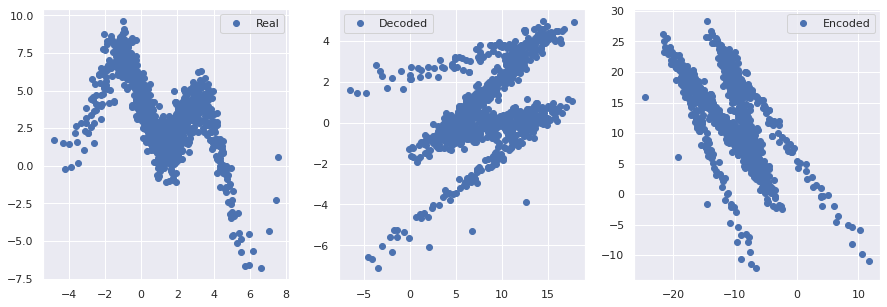

In [113]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

X = opt.TRANS_DISTRY()
Y = rand_scm(X)

ax[0].plot(X.cpu().detach().numpy(), Y.cpu().detach().numpy(), 'o', label="Real")
ax[0].legend()

X = X.cuda()
Y = Y.cuda()

gt_decoder.cuda()
gt_decoder.eval()
X_dec, Y_dec = gt_decoder(X, Y)

ax[1].plot(X_dec.cpu().detach().numpy(), Y_dec.cpu().detach().numpy(), 'o', label="Decoded")
ax[1].legend()

encoder.cuda()
encoder.eval()
X_enc, Y_enc = encoder(X_dec, Y_dec)

ax[2].plot(X_enc.cpu().detach().numpy(), Y_enc.cpu().detach().numpy(), 'o', label="Encoded")
ax[2].legend()

In [114]:
probe_xcoders(encoder, gt_decoder, init_y=0.)

Initial (A, B) = 1.0, 0.0
Decoded (X, Y) = 1.600000023841858, -0.8999999761581421
Encoded (U, V) = -3.99686598777771, 0.38506531715393066


In [115]:
np.linalg.inv([[1, 2], [3, 4]])

array([[-2. ,  1. ],
       [ 1.5, -0.5]])

In [116]:
alpha = tu.make_alpha(opt)

In [117]:
model_x2y = mdn(opt)
model_y2x = mdn(opt)

In [118]:
opt.NUM_META_ITER = 500
with torch.autograd.detect_anomaly():
    frames = encoder_train_shared_regret_moreparams(opt, model_x2y, model_y2x, rand_scm, encoder, gt_decoder, alpha)

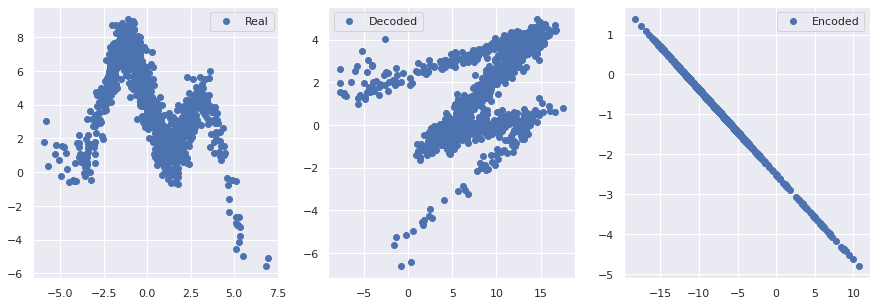

In [119]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

X = opt.TRANS_DISTRY()
Y = rand_scm(X)

ax[0].plot(X.cpu().detach().numpy(), Y.cpu().detach().numpy(), 'o', label="Real")
ax[0].legend()

X = X.cuda()
Y = Y.cuda()

gt_decoder.cuda()
gt_decoder.eval()
X_dec, Y_dec = gt_decoder(X, Y)

ax[1].plot(X_dec.cpu().detach().numpy(), Y_dec.cpu().detach().numpy(), 'o', label="Decoded")
ax[1].legend()

encoder.cuda()
encoder.eval()
X_enc, Y_enc = encoder(X_dec, Y_dec)

ax[2].plot(X_enc.cpu().detach().numpy(), Y_enc.cpu().detach().numpy(), 'o', label="Encoded")
ax[2].legend()

In [ ]:
plot_params(frames, {'m2': -2, 'm4': -0.5})

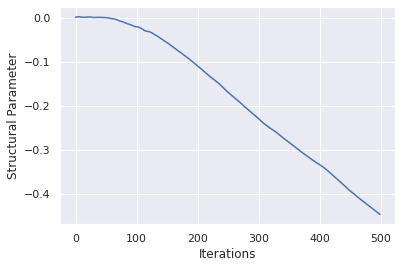

In [120]:
plot_key(frames, 'alpha', name='Structural Parameter')

In [ ]:
a = torch.tensor([[1, 1], [2, 4]])
print(a.shape)
torch.unsqueeze(a, dim=1).unsqueeze(2).shape

## Unknown nonlinear encoder

In [121]:
def encoder_train_shared_regret_mlp(opt, model_x2y, model_y2x, scm, encoder, decoder, alpha): 
    if opt.CUDA: 
        model_x2y = model_x2y.cuda()
        model_y2x = model_y2x.cuda()
        encoder = encoder.cuda()
        decoder = decoder.cuda()
    encoder_optim = torch.optim.Adam(encoder.parameters(), opt.ENCODER_LR)
    alpha_optim = torch.optim.Adam([alpha], opt.ALPHA_LR)
    frames = []

    xs = []
    for i in range(10):
        xs.append(opt.TRANS_DISTRY())

    X_val = torch.cat(xs, dim=0)
    Y_val = scm(X_val)

    if opt.CUDA: 
        X_val, Y_val = X_val.cuda(), Y_val.cuda()

    for meta_iter in tqdm.trange(opt.NUM_META_ITER): 
        # Preheat the models
        _ = tu.train_nll(opt, model_x2y, scm, opt.TRAIN_DISTRY, 'X2Y', 
                         mdn_nll, decoder, encoder)
        _ = tu.train_nll(opt, model_y2x, scm, opt.TRAIN_DISTRY, 'Y2X', 
                         mdn_nll, decoder, encoder)

        # Sample from SCM
        X = opt.TRANS_DISTRY()
        Y = scm(X)
        if opt.CUDA: 
            X, Y = X.cuda(), Y.cuda()
        # Decode 
        with torch.no_grad(): 
            X, Y = decoder(X, Y)
        # Encode
        encoder.train()
        X, Y = encoder(X, Y)
        encoder.eval()
        with torch.no_grad():
            if opt.USE_BASELINE:
                baseline_y = marginal_nll(opt, Y, mdn_nll)
                baseline_x = marginal_nll(opt, X, mdn_nll)
            else:
                baseline_y = 0.
                baseline_x = 0.
        # Save state dicts
        state_x2y = deepcopy(model_x2y.state_dict())
        state_y2x = deepcopy(model_y2x.state_dict())
        # Inner loop 
        optim_x2y = torch.optim.Adam(model_x2y.parameters(), lr=opt.FINETUNE_LR)
        optim_y2x = torch.optim.Adam(model_y2x.parameters(), lr=opt.FINETUNE_LR)
        regrets_x2y = []
        regrets_y2x = []
        is_nan = False
        # Evaluate regret discrepancy 
        for t in range(opt.FINETUNE_NUM_ITER):
            loss_x2y = mdn_nll(model_x2y(X), Y)
            loss_y2x = mdn_nll(model_y2x(Y), X)
            if torch.isnan(loss_x2y).item() or torch.isnan(loss_y2x).item(): 
                is_nan = True
                break
            optim_x2y.zero_grad()
            optim_y2x.zero_grad()
            loss_x2y.backward(retain_graph=True) 
            loss_y2x.backward(retain_graph=True)
            # Filter out NaNs that might have sneaked in
            nan_in_x2y = gradnan_filter(model_x2y)
            nan_in_y2x = gradnan_filter(model_y2x)
            if nan_in_x2y or nan_in_y2x: 
                is_nan = True
                break
            optim_x2y.step()
            optim_y2x.step()
            # Store for encoder
            regrets_x2y.append(loss_x2y + baseline_x)
            regrets_y2x.append(loss_y2x + baseline_y)
        if not is_nan:
            # Evaluate total regret
            regret_x2y = torch.stack(regrets_x2y).mean()
            regret_y2x = torch.stack(regrets_y2x).mean()
            # Evaluate losses
            loss = torch.logsumexp(
                torch.stack([F.logsigmoid(alpha) + regret_x2y,
                             F.logsigmoid(-alpha) + regret_y2x]), 
                0)
            # Optimize
            encoder_optim.zero_grad()
            alpha_optim.zero_grad()
            #print(loss, F.logsigmoid(alpha), regret_x2y, F.logsigmoid(-alpha), regret_y2x, loss_x2y, baseline_x, loss_y2x, baseline_y)
            try:
                loss.backward()

            except:
                print(f"Jumped iteration {meta_iter}")
                model_x2y.load_state_dict(state_x2y)
                model_y2x.load_state_dict(state_y2x)
                continue
            # Make sure no nans
            # if torch.isnan(encoder.theta.grad.data).any(): 
            #     encoder.theta.grad.data.zero_()
            if torch.isnan(alpha.grad.data).any(): 
                alpha.grad.data.zero_()
            encoder_optim.step()
            alpha_optim.step()
            # Load original state dicts
            model_x2y.load_state_dict(state_x2y)
            model_y2x.load_state_dict(state_y2x)
            # Add info
            encoder.eval()
            with torch.no_grad():
                X_de, Y_de = decoder(X_val, Y_val)
                X_deen, Y_deen = encoder(X_de, Y_de)
                XY_deen = torch.cat([X_deen, Y_deen], dim=-1)
                XY_val = torch.cat([X_val, Y_val], dim=-1)
                mse = F.mse_loss(XY_deen, XY_val)
            encoder.train()
            frames.append(Namespace(iter_num=meta_iter, 
                                    regret_x2y=regret_x2y.item(), 
                                    regret_y2x=regret_y2x.item(),
                                    loss=loss.item(),
                                    alpha=alpha.item(), 
                                    mse=mse))

        else:
            # Load original state dicts
            model_x2y.load_state_dict(state_x2y)
            model_y2x.load_state_dict(state_y2x)
            # Add dummy info
            frames.append(Namespace(iter_num=meta_iter, 
                                    regret_x2y=float('nan'), 
                                    regret_y2x=float('nan'),
                                    loss=float('nan'),
                                    alpha=float('nan'), 
                                    mse=float('nan')))
                
    return frames

In [129]:
class NetworkEncoder(nn.Module):
    def __init__(self, in_size, hidden, decoder=False):
        super().__init__()
        self.net = nn.Sequential()
        #self.net.add_module('norm', nn.BatchNorm1d(in_size))
        pre = in_size
        for i, hid in enumerate(hidden):
            self.net.add_module(f'h{i}', nn.Linear(pre, hid))
            #self.net.add_module(f'norm{i}', nn.BatchNorm1d(hid))
            self.net.add_module(f'h{i}_act', nn.ReLU())
            pre = hid

        self.net.add_module('out', nn.Linear(hidden[-1], in_size))

    def forward(self, X, Y):
        XY = torch.cat([X, Y], dim=-1)
        encoded = self.net(XY)

        return encoded[:, 0:1], encoded[:, 1:2]

In [130]:
gt_decoder = NetworkEncoder(2, [32, 32, 32], decoder=True)
encoder = NetworkEncoder(2, [32, 32, 32])

In [124]:
alpha = tu.make_alpha(opt)

In [125]:
model_x2y = mdn(opt)
model_y2x = mdn(opt)

In [128]:
opt.NUM_META_ITER = 1000
torch.distributions.Distribution.set_default_validate_args(True)
with torch.autograd.detect_anomaly():
    frames = encoder_train_shared_regret_mlp(opt, model_x2y, model_y2x, rand_scm, encoder, gt_decoder, alpha)

KeyboardInterrupt: ignored

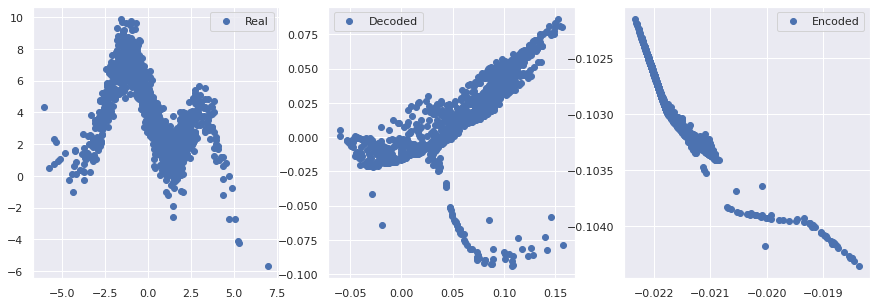

In [131]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

X = opt.TRAIN_DISTRY()
Y = rand_scm(X)

ax[0].plot(X.cpu().detach().numpy(), Y.cpu().detach().numpy(), 'o', label="Real")
ax[0].legend()

X = X.cuda()
Y = Y.cuda()

gt_decoder.cuda()
gt_decoder.eval()
X_dec, Y_dec = gt_decoder(X, Y)

ax[1].plot(X_dec.cpu().detach().numpy(), Y_dec.cpu().detach().numpy(), 'o', label="Decoded")
ax[1].legend()

encoder.cuda()
encoder.eval()
X_enc, Y_enc = encoder(X_dec, Y_dec)

ax[2].plot(X_enc.cpu().detach().numpy(), Y_enc.cpu().detach().numpy(), 'o', label="Encoded")
ax[2].legend()

In [ ]:
mses = [frame.mse for frame in frames]

plt.plot(mses)
plt.show()

In [66]:
with torch.no_grad():
    _X = torch.tensor([[1.]])
    _Y = torch.tensor([[0.]])
    encoder.eval()
    if opt.CUDA:
        _X, _Y = _X.to('cuda'), _Y.to('cuda')
    _X_d, _Y_d = gt_decoder(_X, _Y)
    _X_de, _Y_de = encoder(_X_d, _Y_d)
    encoder.train()
print(f"Initial (A, B) = {_X.item()}, {_Y.item()}")
print(f"Decoded (X, Y) = {_X_d.item()}, {_Y_d.item()}")
print(f"Encoded (U, V) = {_X_de.item()}, {_Y_de.item()}")

Initial (A, B) = 1.0, 0.0
Decoded (X, Y) = -0.06758479028940201, 0.12775647640228271
Encoded (U, V) = -3.540479898452759, -2.718916893005371


In [67]:
while True:
    with torch.no_grad():
        X = opt.TRANS_DISTRY()
        Y = scm(X)
        Xp, Yp = X, Y
        if opt.CUDA: 
            X, Y = X.cuda(), Y.cuda()

        encoder.eval()
        # Decode 
        X, Y = gt_decoder(X, Y)
        # Encode
        X, Y = encoder(X, Y)
        
        baseline_y = marginal_nll(opt, Y, mdn_nll)
        
        encoder.train()

    if torch.isnan(baseline_y):
        print(Xp, Yp, baseline_y)
        break

NameError: ignored

In [ ]:
with torch.no_grad():
    X, Y = Xp, Yp
    if opt.CUDA: 
        X, Y = X.cuda(), Y.cuda()
    if opt.CUDA: 
        X, Y = X.cuda(), Y.cuda()
    encoder.eval()
    # Decode
    X, Y = gt_decoder(X, Y)
    # Encode
    X, Y = encoder(X, Y)

    inp = Y
    nll = mdn_nll
    model_g = gmm(opt)
    if opt.CUDA: 
        model_g = model_g.cuda()
    model_g.fit(inp, n_iter=opt.EM_ITERS)
    with torch.no_grad():
        y = inp
        reduce = True
        pi, mu, sigma = model_g(inp)
        m = torch.distributions.Normal(loc=mu, scale=sigma)
        log_prob_y = m.log_prob(y)
        log_prob_pi_y = log_prob_y + torch.log(pi)
        print(torch.isnan(log_prob_y).any(), y)
        loss = -torch.logsumexp(log_prob_pi_y, dim=1)
        if reduce:
            loss_marginal = torch.mean(loss)
        else:
            loss_marginal = loss
    baseline_y = loss_marginal
    encoder.train()

print(baseline_y)

In [ ]:
from tqdm import tnrange, tqdm_notebook

In [ ]:
model = model_x2y
train_distr_fn = opt.TRAIN_DISTRY
polarity = 'X2Y'
loss_fn = mdn_nll
scm = rand_scm

with torch.autograd.detect_anomaly():
    optim = torch.optim.Adam(model.parameters(), lr=opt.LR)
    if opt.CUDA:
        model = model.cuda()
        if encoder is not None: 
            encoder = encoder.cuda()
        if gt_decoder is not None: 
            gt_decoder = gt_decoder.cuda()
    frames = []
    for iter_num in tnrange(opt.NUM_ITER, leave=False):
        # Generate samples from the training distry
        X = train_distr_fn()
        with torch.no_grad():
            Y = scm(X)
        if opt.CUDA:
            X, Y = X.cuda(), Y.cuda()
        with torch.no_grad():
            if gt_decoder is not None:
                # X and Y are sampled from the underlying distribution.
                # We apply a secret random transformation to the true latent
                # variables to obtain the raw input
                X, Y = gt_decoder(X, Y)
            if encoder is not None:
                # Apply the encoder, meant to "undo" the decoder up to swapping X and Y.
                encoder.eval()
                X, Y = encoder(X, Y)
                encoder.train()
        # Now, train as usual
        if polarity == 'X2Y':
            inp, tar = X, Y
        elif polarity == 'Y2X':
            inp, tar = Y, X
        else:
            raise ValueError
        if opt.CUDA:
            inp, tar = inp.cuda(), tar.cuda()
        # Train
        out = model(inp)
        loss = loss_fn(out, tar)
        optim.zero_grad()
        loss.backward()
        optim.step()
        # Append info
        if iter_num % opt.REC_FREQ or iter_num == (opt.NUM_ITER - 1):
            info = Namespace(loss=loss.item(),
                                iter_num=iter_num)
            frames.append(info)

In [ ]:
model_x2y.z_pi.weight

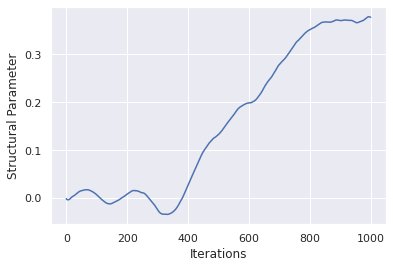

In [68]:
plot_key(frames, 'alpha', name='Structural Parameter')

# Gaussians

In [190]:
opt.TRAIN_MUS = [0, 10]
opt.TRANS_MUS = [-2, -7]

opt.TRAIN_STDS = [1, 1]
opt.TRANS_STDS = [1, 1]

opt.TRAIN_DISTRY = lambda: torch.cat([normal(opt.TRAIN_MUS[0], opt.TRAIN_STDS[0], int(opt.NUM_SAMPLES / 2)), normal(opt.TRAIN_MUS[1], opt.TRAIN_STDS[1], int(opt.NUM_SAMPLES / 2))])
opt.TRANS_DISTRY = lambda: torch.cat([normal(opt.TRANS_MUS[0], opt.TRANS_STDS[0], int(opt.NUM_SAMPLES / 2)), normal(opt.TRANS_MUS[1], opt.TRANS_STDS[1], int(opt.NUM_SAMPLES / 2))])

In [191]:
def gaussian_mixture(mode, opt):
    if mode == 'train':
        sx1 = opt.TRAIN_STDS[0]
        sx2 = opt.TRAIN_STDS[1]
        mux1 = opt.TRAIN_MUS[0]
        mux2 = opt.TRAIN_MUS[1]

    elif mode == 'trans':
        sx1 = opt.TRANS_STDS[0]
        sx2 = opt.TRANS_STDS[1]
        mux1 = opt.TRANS_MUS[0]
        mux2 = opt.TRANS_MUS[1]

    def wrapper(x):
        rho = 0.5
        muy1 = 2
        muy2 = 10
        sy1 = 2
        sy2 = 2
        muy_x1 = muy1 + (sy1 / sx1) * rho * (x[:500] - mux1)
        muy_x2 = muy2 + (sy2 / sx2) * rho * (x[500:] - mux2)
        sy_x1 = (1 - rho ** 2) * (sy1 ** 2)
        sy_x2 = (1 - rho ** 2) * (sy2 ** 2)

        n1 = torch.normal(muy_x1, torch.ones_like(muy_x1) * sy_x1)
        n2 = torch.normal(muy_x2, torch.ones_like(muy_x2) * sy_x2)
        
        return torch.cat([n1, n2])

    return wrapper

In [192]:
def encoder_train_shared_regret_gm_mlp(opt, model_x2y, model_y2x, gm, encoder, decoder, alpha): 
    if opt.CUDA: 
        model_x2y = model_x2y.cuda()
        model_y2x = model_y2x.cuda()
        encoder = encoder.cuda()
        decoder = decoder.cuda()
    encoder_optim = torch.optim.Adam(encoder.parameters(), opt.ENCODER_LR)
    alpha_optim = torch.optim.Adam([alpha], opt.ALPHA_LR)
    frames = []

    xs = []
    for i in range(10):
        xs.append(opt.TRANS_DISTRY())

    X_val = torch.cat(xs, dim=0)
    Y_val = gm('trans', opt)(X_val)

    if opt.CUDA: 
        X_val, Y_val = X_val.cuda(), Y_val.cuda()

    for meta_iter in tqdm.trange(opt.NUM_META_ITER): 
        # Preheat the models
        _ = tu.train_nll(opt, model_x2y, gm('train', opt), opt.TRAIN_DISTRY, 'X2Y', 
                         mdn_nll, decoder, encoder)
        _ = tu.train_nll(opt, model_y2x, gm('train', opt), opt.TRAIN_DISTRY, 'Y2X', 
                         mdn_nll, decoder, encoder)

        # Sample from SCM
        X = opt.TRANS_DISTRY()
        Y = gm('trans', opt)(X)
        if opt.CUDA: 
            X, Y = X.cuda(), Y.cuda()
        # Decode 
        with torch.no_grad(): 
            X, Y = decoder(X, Y)
        # Encode
        encoder.train()
        X, Y = encoder(X, Y)
        encoder.eval()
        with torch.no_grad():
            if opt.USE_BASELINE:
                baseline_y = marginal_nll(opt, Y, mdn_nll)
                baseline_x = marginal_nll(opt, X, mdn_nll)
            else:
                baseline_y = 0.
                baseline_x = 0.
        # Save state dicts
        state_x2y = deepcopy(model_x2y.state_dict())
        state_y2x = deepcopy(model_y2x.state_dict())
        # Inner loop 
        optim_x2y = torch.optim.Adam(model_x2y.parameters(), lr=opt.FINETUNE_LR)
        optim_y2x = torch.optim.Adam(model_y2x.parameters(), lr=opt.FINETUNE_LR)
        regrets_x2y = []
        regrets_y2x = []
        is_nan = False
        # Evaluate regret discrepancy 
        for t in range(opt.FINETUNE_NUM_ITER):
            loss_x2y = mdn_nll(model_x2y(X), Y)
            loss_y2x = mdn_nll(model_y2x(Y), X)
            if torch.isnan(loss_x2y).item() or torch.isnan(loss_y2x).item(): 
                is_nan = True
                break
            optim_x2y.zero_grad()
            optim_y2x.zero_grad()
            loss_x2y.backward(retain_graph=True) 
            loss_y2x.backward(retain_graph=True)
            # Filter out NaNs that might have sneaked in
            nan_in_x2y = gradnan_filter(model_x2y)
            nan_in_y2x = gradnan_filter(model_y2x)
            if nan_in_x2y or nan_in_y2x: 
                is_nan = True
                break
            optim_x2y.step()
            optim_y2x.step()
            # Store for encoder
            regrets_x2y.append(loss_x2y + baseline_x)
            regrets_y2x.append(loss_y2x + baseline_y)
        if not is_nan:
            # Evaluate total regret
            regret_x2y = torch.stack(regrets_x2y).mean()
            regret_y2x = torch.stack(regrets_y2x).mean()
            # Evaluate losses
            loss = torch.logsumexp(
                torch.stack([F.logsigmoid(alpha) + regret_x2y,
                             F.logsigmoid(-alpha) + regret_y2x]), 
                0)
            # Optimize
            encoder_optim.zero_grad()
            alpha_optim.zero_grad()
            #print(loss, F.logsigmoid(alpha), regret_x2y, F.logsigmoid(-alpha), regret_y2x, loss_x2y, baseline_x, loss_y2x, baseline_y)
            try:
                loss.backward()

            except:
                print(f"Jumped iteration {meta_iter}")
                model_x2y.load_state_dict(state_x2y)
                model_y2x.load_state_dict(state_y2x)
                continue
            # Make sure no nans
            # if torch.isnan(encoder.theta.grad.data).any(): 
            #     encoder.theta.grad.data.zero_()
            if torch.isnan(alpha.grad.data).any(): 
                alpha.grad.data.zero_()
            encoder_optim.step()
            alpha_optim.step()
            # Load original state dicts
            model_x2y.load_state_dict(state_x2y)
            model_y2x.load_state_dict(state_y2x)
            # Add info
            encoder.eval()
            with torch.no_grad():
                X_de, Y_de = decoder(X_val, Y_val)
                X_deen, Y_deen = encoder(X_de, Y_de)
                XY_deen = torch.cat([X_deen, Y_deen], dim=-1)
                XY_val = torch.cat([X_val, Y_val], dim=-1)
                mse = F.mse_loss(XY_deen, XY_val)
            encoder.train()
            frames.append(Namespace(iter_num=meta_iter, 
                                    regret_x2y=regret_x2y.item(), 
                                    regret_y2x=regret_y2x.item(),
                                    loss=loss.item(),
                                    alpha=alpha.item(), 
                                    mse=mse))

        else:
            # Load original state dicts
            model_x2y.load_state_dict(state_x2y)
            model_y2x.load_state_dict(state_y2x)
            # Add dummy info
            frames.append(Namespace(iter_num=meta_iter, 
                                    regret_x2y=float('nan'), 
                                    regret_y2x=float('nan'),
                                    loss=float('nan'),
                                    alpha=float('nan'), 
                                    mse=float('nan')))
                
    return frames

In [193]:
gt_decoder = NetworkEncoder(2, [32, 32, 32], decoder=True)
encoder = NetworkEncoder(2, [32, 32, 32])

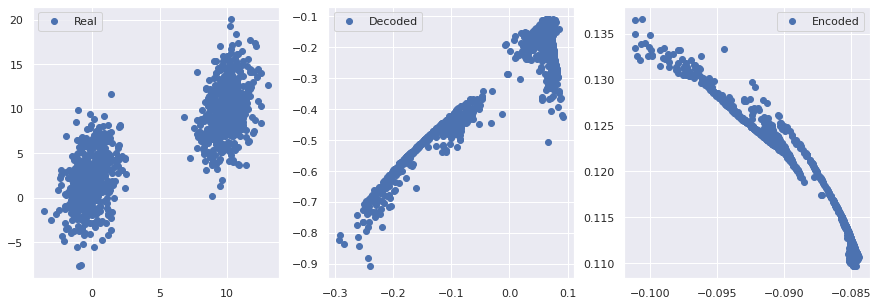

In [194]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

X = opt.TRAIN_DISTRY()
Y = gaussian_mixture('train', opt)(X)

ax[0].plot(X.cpu().detach().numpy(), Y.cpu().detach().numpy(), 'o', label="Real")
ax[0].legend()

X = X.cuda()
Y = Y.cuda()

gt_decoder.cuda()
gt_decoder.eval()
X_dec, Y_dec = gt_decoder(X, Y)

ax[1].plot(X_dec.cpu().detach().numpy(), Y_dec.cpu().detach().numpy(), 'o', label="Decoded")
ax[1].legend()

encoder.cuda()
encoder.eval()
X_enc, Y_enc = encoder(X_dec, Y_dec)

ax[2].plot(X_enc.cpu().detach().numpy(), Y_enc.cpu().detach().numpy(), 'o', label="Encoded")
ax[2].legend()

In [195]:
alpha = tu.make_alpha(opt)

In [196]:
model_x2y = mdn(opt)
model_y2x = mdn(opt)

In [197]:
opt.NUM_META_ITER = 1000
torch.distributions.Distribution.set_default_validate_args(True)
with torch.autograd.detect_anomaly():
    frames = encoder_train_shared_regret_gm_mlp(opt, model_x2y, model_y2x, gaussian_mixture, encoder, gt_decoder, alpha)

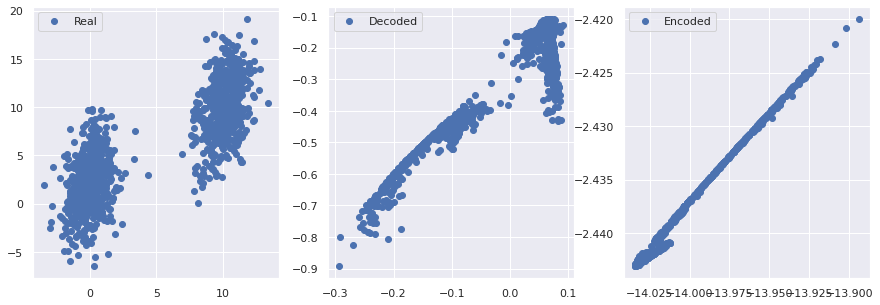

In [198]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

X = opt.TRAIN_DISTRY()
Y = gaussian_mixture('train', opt)(X)

ax[0].plot(X.cpu().detach().numpy(), Y.cpu().detach().numpy(), 'o', label="Real")
ax[0].legend()

X = X.cuda()
Y = Y.cuda()

gt_decoder.cuda()
gt_decoder.eval()
X_dec, Y_dec = gt_decoder(X, Y)

ax[1].plot(X_dec.cpu().detach().numpy(), Y_dec.cpu().detach().numpy(), 'o', label="Decoded")
ax[1].legend()

encoder.cuda()
encoder.eval()
X_enc, Y_enc = encoder(X_dec, Y_dec)

ax[2].plot(X_enc.cpu().detach().numpy(), Y_enc.cpu().detach().numpy(), 'o', label="Encoded")
ax[2].legend()

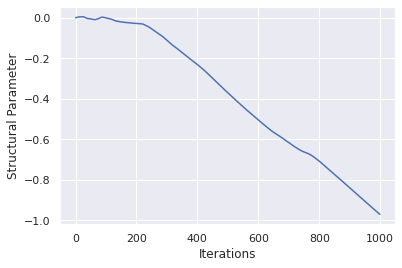

In [199]:
plot_key(frames, 'alpha', name='Structural Parameter')